**Let's Stop Wildfire Hackathon**
organized by AI For Mankind

This is a somple notebook to train a wildfire smoke classifier for Wildfire Smoke Detection Challenge 1B 

https://github.com/aiformankind/lets-stop-wildfires-hackathon/blob/master/wildfire_smoke_challenge_1B.md

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


**Check Tensorflow version and load Tensorboard notebook extension**

In [2]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

# Load the TensorBoard notebook extension
%load_ext tensorboard

TensorFlow 2.x selected.


**Verify GPU Device**

In [3]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


**Download wildfire smoke image dataset: gridded version**


In [4]:
!wget "https://www.dropbox.com/s/rl0qbub4clah2w9/grid_version.tar"

--2020-02-15 22:06:14--  https://www.dropbox.com/s/rl0qbub4clah2w9/grid_version.tar
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.1, 2620:100:6021:1::a27d:4101
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/rl0qbub4clah2w9/grid_version.tar [following]
--2020-02-15 22:06:14--  https://www.dropbox.com/s/raw/rl0qbub4clah2w9/grid_version.tar
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc65659e43fb0e94e5f5232418b4.dl.dropboxusercontent.com/cd/0/inline/AyJvmJHLm9m5gdNgLthEzG8RzpyJrNY0d3OfttCa0Yx0a6uc0PtFvL9k2KiohEQNzCeeUtQJZm12OatvZobf0ay28GvYeSFuATgmp9g_meymEnHFODK6l_FXUVvbD-BwJKI/file# [following]
--2020-02-15 22:06:14--  https://uc65659e43fb0e94e5f5232418b4.dl.dropboxusercontent.com/cd/0/inline/AyJvmJHLm9m5gdNgLthEzG8RzpyJrNY0d3OfttCa0Yx0a6uc0PtFvL9k2KiohEQNzCeeUtQJZm12OatvZobf0ay28GvYeSFuATg

**Extract the wildfire smoke dataset: gridded version**

In [5]:
!tar -xvf 'grid_version.tar'

Streaming output truncated to the last 5000 lines.
grid_version/train/grid_no_smoke/1498418433_+02040_06_05.png
grid_version/train/grid_no_smoke/1498418373_+01980_08_09.png
grid_version/train/grid_no_smoke/1498418493_+02100_05_06.png
grid_version/train/grid_no_smoke/1498417893_+01500_02_06.png
grid_version/train/grid_no_smoke/1498418253_+01860_04_07.png
grid_version/train/grid_no_smoke/1498418013_+01620_09_06.png
grid_version/train/grid_no_smoke/1498416993_+00600_04_08.png
grid_version/train/grid_no_smoke/1498416993_+00600_03_01.png
grid_version/train/grid_no_smoke/1498417233_+00840_02_01.png
grid_version/train/grid_no_smoke/1498416693_+00300_08_07.png
grid_version/train/grid_no_smoke/1498416693_+00300_06_02.png
grid_version/train/grid_no_smoke/1498418013_+01620_07_03.png
grid_version/train/grid_no_smoke/1498418373_+01980_01_05.png
grid_version/train/grid_no_smoke/1498417533_+01140_03_05.png
grid_version/train/grid_no_smoke/1498416753_+00360_03_04.png
grid_version/train/grid_no_smoke/1

**Specify the train and validate folders**

In [0]:
train_input_folder ='grid_version/train'
validate_input_folder = 'grid_version/validate'


**Create train and validation splits**

In [0]:
from imutils import paths
import os
import shutil
import random

def split_data(directory, validate_directory='validation', split=0.8): 
  directories = [os.path.join(directory, o) for o in os.listdir(directory) 
                    if os.path.isdir(os.path.join(directory,o))]
  print(directories)
  for directory in directories:
    image_paths = list(paths.list_images(directory))
    
    random.seed(32)
    random.shuffle(image_paths)
    image_paths
   
    # compute the training and testing split
    i = int(len(image_paths) * split)    
    train_paths = image_paths[:i]
    selected_for_validation_paths = image_paths[i:]
    for path in selected_for_validation_paths:
       category = os.path.basename(os.path.normpath(directory))
       dest_path = os.path.join(validate_directory, category)
       if not os.path.exists(dest_path):
           os.makedirs(dest_path)
       shutil.move(path, dest_path)   

  


In [7]:
!ls grid_version/validate

grid_no_smoke  grid_smoke


In [0]:
split_data(directory='grid_version/train/', validate_directory='grid_version/validation')  

['grid_version/train/grid_no_smoke', 'grid_version/train/grid_smoke']


In [0]:
!ls grid_version/validation/grid_smoke

In [0]:
!ls grid_version/validation/grid_no_smoke

**Create train and validate data generators**


In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#apply image augmentation
train_image_generator =  ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)
"""ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    brightness_range=[0.5, 1.5],
    rotation_range=40)"""
    
validate_image_generator = ImageDataGenerator(rescale=1./255)



In [18]:
batch_size = 40 #16 #40
image_width = 224 #150 #224
image_height = 224 #150 #223
IMAGE_WIDTH_HEIGHT = (image_width, image_height)

class_mode = 'categorical'
total_classes = 2
activation_function = 'softmax'
loss = 'categorical_crossentropy'

#create train data generator flowing from train_input_folder
train_generator = train_image_generator.flow_from_directory(
            train_input_folder,
            target_size=IMAGE_WIDTH_HEIGHT,
            batch_size=batch_size,
            class_mode=class_mode)
            
#create validation data generator flowing from validate_input_folder
validation_generator = validate_image_generator.flow_from_directory(
        validate_input_folder,
        target_size=IMAGE_WIDTH_HEIGHT,
        batch_size=batch_size,
        class_mode=class_mode)
        

Found 3621 images belonging to 2 classes.
Found 3621 images belonging to 2 classes.


In [0]:
# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
import matplotlib.pyplot as plt
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

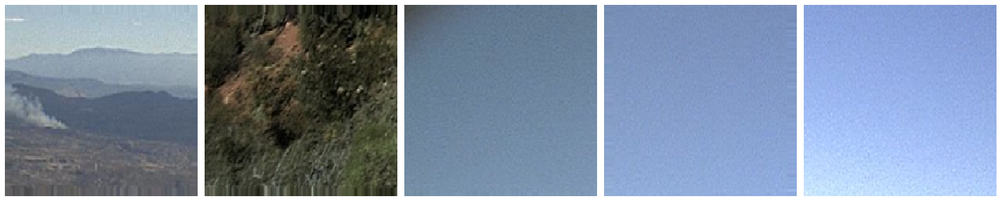

In [20]:
sample_training_images, _ = next(train_generator)
plotImages(sample_training_images[:100])

**Create custom model**

In [21]:
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras import backend as K

img_input = layers.Input(shape=(image_width, image_height, 3))
input_shape = (image_width, image_height, 3)

model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(2))
model.add(Activation('softmax'))

model.compile(loss=loss,#'binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

"""
total_classes = 1
activation_function = 'sigmoid'
loss = 'binary_crossentropy'
img_input = layers.Input(shape=(image_width, image_height, 3))

x = layers.Conv2D(32, 3, activation='relu')(img_input)
x = layers.MaxPooling2D(2)(x)

x = layers.Conv2D(64, 3, activation='relu')(x)
x = layers.MaxPooling2D(2)(x)

x = layers.Flatten()(x)

x = layers.Dense(512, activation='relu')(x)

x = layers.Dropout(0.5)(x)

output = layers.Dense(total_classes, activation= activation_function)(x)

model = Model(img_input, output)

model.compile(loss=loss,
              optimizer=Adam(lr=0.001),
              metrics=['accuracy'])"""

"\ntotal_classes = 1\nactivation_function = 'sigmoid'\nloss = 'binary_crossentropy'\nimg_input = layers.Input(shape=(image_width, image_height, 3))\n\nx = layers.Conv2D(32, 3, activation='relu')(img_input)\nx = layers.MaxPooling2D(2)(x)\n\nx = layers.Conv2D(64, 3, activation='relu')(x)\nx = layers.MaxPooling2D(2)(x)\n\nx = layers.Flatten()(x)\n\nx = layers.Dense(512, activation='relu')(x)\n\nx = layers.Dropout(0.5)(x)\n\noutput = layers.Dense(total_classes, activation= activation_function)(x)\n\nmodel = Model(img_input, output)\n\nmodel.compile(loss=loss,\n              optimizer=Adam(lr=0.001),\n              metrics=['accuracy'])"

**Start model training**

In [22]:
import datetime, os
import tensorflow as tf

epochs = 10
steps_per_epoch = train_generator.n // train_generator.batch_size
validation_steps = validation_generator.n // validation_generator.batch_size

logdir = os.path.join("tf_logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

history = model.fit_generator(
      train_generator,
      steps_per_epoch=steps_per_epoch,
      validation_data=validation_generator,
      validation_steps=validation_steps,
      epochs=epochs,
      callbacks=[tensorboard_callback])

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 90 steps, validate for 90 steps
Epoch 1/10
90/90 [==============================] - 51s 563ms/step - loss: 0.6141 - accuracy: 0.7772 - val_loss: 0.2524 - val_accuracy: 0.8961
Epoch 2/10
90/90 [==============================] - 49s 549ms/step - loss: 0.3026 - accuracy: 0.8704 - val_loss: 0.2698 - val_accuracy: 0.8581
Epoch 3/10
90/90 [==============================] - 49s 550ms/step - loss: 0.2496 - accuracy: 0.9076 - val_loss: 0.2051 - val_accuracy: 0.9122
Epoch 4/10
90/90 [==============================] - 50s 554ms/step - loss: 0.2198 - accuracy: 0.9171 - val_loss: 0.1178 - val_accuracy: 0.9403
Epoch 5/10
90/90 [==============================] - 50s 552ms/step - loss: 0.1719 - accuracy: 0.9358 - val_loss: 0.1819 - val_accuracy: 0.9017
Epoch 6/10
90/90 [==============================] - 50s 557ms/step - loss: 0.1742 - accuracy: 0.9425 - val_loss: 0.0954 - val_accuracy: 0.9639
Epoch 7/10
90/90 [==============================] 

Text(0.5, 0, 'epoch')

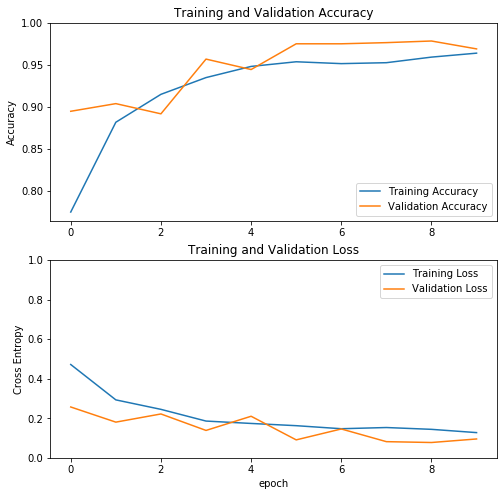

In [12]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()), 1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0, 1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')

In [0]:
%tensorboard --logdir tf_logs


<IPython.core.display.Javascript object>

In [0]:
model.save('saved_model_MT_cat.h5')

In [0]:
import tensorflow as tf
model = tf.keras.models.load_model('saved_model_MT_cat.h5')

In [14]:

true_classes = train_generator.classes
print(true_classes)
class_labels = list(train_generator.class_indices.keys())   
print(class_labels)

[0 0 0 ... 1 1 1]
['grid_no_smoke', 'grid_smoke']


In [0]:
def predict(model, image_path):
        IMAGE_SHAPE = (224, 224)
        import numpy as np
        import PIL.Image as Image

        image = Image.open(image_path) 
        image = image.resize(IMAGE_SHAPE)   
        image_data = np.array(image) / 255.0
        
        result = model.predict(image_data[np.newaxis, ...])
        
        result.shape
        print(result)

        predicted_class = np.argmax(result[0], axis=-1)
        print("{},{}".format(image_path, predicted_class))
        return predicted_class

In [0]:

import os
import csv


directory = 'grid_version/validate/grid_smoke/'
prediction_output_file = 'predictions.csv'
false_pos_list = []

with open(prediction_output_file, mode='w') as predict_file:
    predict_writer = csv.writer(predict_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
    
    for filename in os.listdir(directory):
        if filename.endswith('.JPG') or filename.endswith('.jpg') or filename.endswith('.png'): 
            predicted = predict(model, os.path.join(directory, filename))
            predict_writer.writerow([filename, predicted])
            # display false positive
            if predicted == 0:
              false_pos_list.append(filename)
            continue
        else:
            continue

print(false_pos_list)

In [0]:
!cat 'predictions.csv'

In [36]:
print(len(false_pos_list))

79


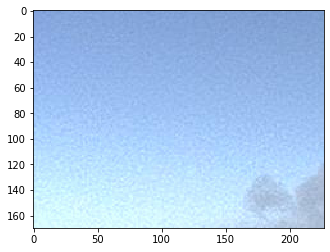

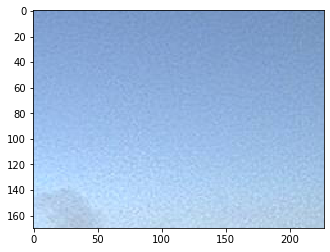

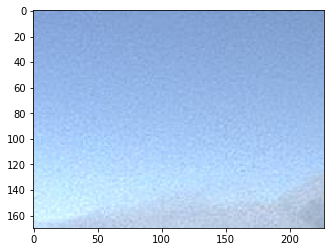

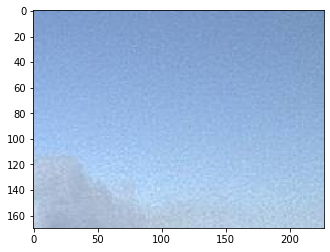

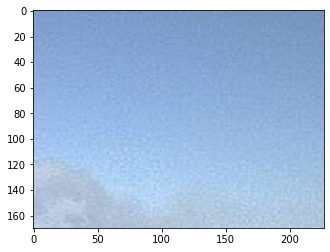

...

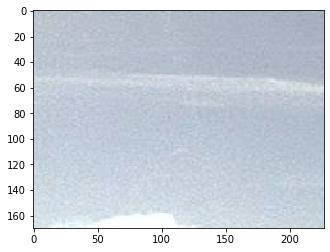

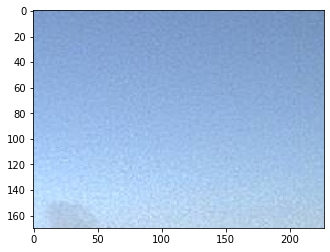

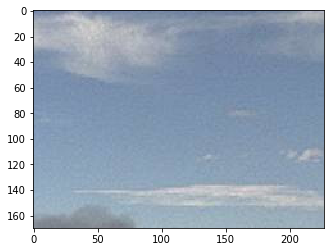

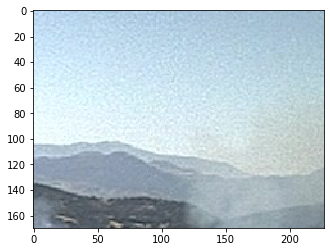

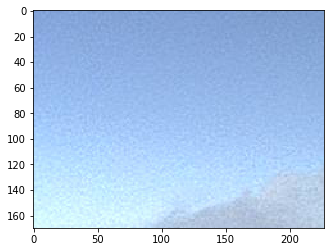

In [35]:
for file in false_pos_list:
  img=mpimg.imread(os.path.join(directory,file))
  imgplot = plt.imshow(img)
  plt.show()

In [39]:
no_smoke_directory = 'grid_version/validate/grid_no_smoke/'
prediction_output_file_no_smoke = 'predictions_no_smoke.csv'
false_neg_list = []

with open(prediction_output_file_no_smoke, mode='w') as predict_file:
    predict_writer = csv.writer(predict_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
    
    for filename in os.listdir(no_smoke_directory):
        if filename.endswith('.JPG') or filename.endswith('.jpg') or filename.endswith('.png'): 
            predicted = predict(model, os.path.join(no_smoke_directory, filename))
            predict_writer.writerow([filename, predicted])
            # display false positive
            if predicted == 1:
              false_neg_list.append(filename)
            continue
        else:
            continue

Streaming output truncated to the last 5000 lines.
grid_version/validate/grid_no_smoke/1498417353_+00960_04_05.png,0
[[1. 0.]]
grid_version/validate/grid_no_smoke/1498417113_+00720_09_04.png,0
[[0.99743456 0.00256548]]
grid_version/validate/grid_no_smoke/1498418553_+02160_02_08.png,0
[[1. 0.]]
grid_version/validate/grid_no_smoke/1498418553_+02160_01_01.png,0
[[0.994358   0.00564196]]
grid_version/validate/grid_no_smoke/1498416693_+00300_03_07.png,0
[[1. 0.]]
grid_version/validate/grid_no_smoke/1498417773_+01380_08_03.png,0
[[9.9975187e-01 2.4811746e-04]]
grid_version/validate/grid_no_smoke/1498417353_+00960_02_03.png,0
[[1. 0.]]
grid_version/validate/grid_no_smoke/1498418553_+02160_08_07.png,0
[[0.99349433 0.00650564]]
grid_version/validate/grid_no_smoke/1498416813_+00420_03_07.png,0
[[1. 0.]]
grid_version/validate/grid_no_smoke/1498418313_+01920_08_01.png,0
[[1. 0.]]
grid_version/validate/grid_no_smoke/1498418313_+01920_06_03.png,0
[[0.99656564 0.00343436]]
grid_version/validate/grid_

In [40]:
print(len(false_neg_list))

0


In [0]:
! ls 'grid_version/validate/grid_no_smoke/'